<h1>Cadenza Project</h1>
<p>This project was designed to create a beat map for a rhythm game if you were given an audio file. Currently, I have used AWS( s3 & DynamoDB) and Docker in order to run this project. There several steps and files to this program but the general flow is this: </p>
<ol>
    <li>Detect Beats</li>
    <li>Detect onsets(complex & hfc)</li>
    <li>Upload Data to S3 for verification</li>
    <li>Upload metadata about music into DynamoDB</li>
    <li>Split detected beats into measures</li>
    <li>Find onsets for a given measure</li>
    <li>Merge HFC and Complex measures together</li>
    <li>Join Measures to one list</li>
</ol>

<p><em>NOTE:</em> an onset is defined here: <a href="https://essentia.upf.edu/reference/std_Onsets.html" target="_blank"> Essentia Library Onsets</a></p>
<p><em>NOTE:</em> HFC and Complex are the detection algorithms for the onsets</p>

<h1> music_data.py </h1>
<p>This class is for housing all metadata about the audio file given to us, it performs the beat detection, and onset detection and saves the audio and diagrams using the Essentia library. Also the essentia library only works on linux, so there will be a module error down below</p>

In [2]:
from essentia.standard import *
from pylab import plot, show, figure, imshow
from decimal import Decimal
import matplotlib.pyplot as plt
import os.path
import json
import pandas as pd

class MusicData:
    """Finds the onsets and beats for a given song"""
    def __init__(self, file_path,  title="", artist=""):
        self.Title = title
        self.Artist = artist
        self.BPM = 0
        self.beat_confidence = 0
        self.beats = []
        self.beat_intervals = []
        self.audio = None
        self.onsets_complex = []
        self.onsets_hfc = []
        self.file_path = file_path
        self.format = os.path.splitext(self.file_path)[1][1:]
        self.audio = MonoLoader(filename=self.file_path)()


    def detect_beats(self):
        """attemps to find beats for a given song"""
        rhythm_extractor = RhythmExtractor2013(method="multifeature")
        bpm, beats, beats_confidence, _, beats_intervals = rhythm_extractor(self.audio)
        self.BPM = bpm
        self.beats = beats
        self.beat_confidence = beats_confidence
        self.beat_intervals = beats_intervals


    def save_beat_diagram(self):
        """Saves the diagram of detected beats in a song"""
        plot(self.audio)
        for beat in self.beats:
            plt.axvline(x=beat*44100, color='red')

        plt.title("Audio waveform and the estimated beat positions")
        plt.savefig("audio_data/beats.png")


    def save_onsets_diagram(self):
        """Saves a diagram of the detected onsets from hfc and complex"""
        
        plot(self.audio)
        for onset in self.onsets_hfc:
            plt.axvline(x=onset*44100, color='red')

        plt.title("Audio waveform and the estimated onset positions (HFC onset detection function)")
        plt.savefig("audio_data/hfc.png")

        plot(self.audio)
        for onset in self.onsets_complex:
            plt.axvline(x=onset*44100, color='red')

        plt.title("Audio waveform and the estimated onset positions (Complex onset detection function)")
        plt.savefig("audio_data/complex.png")


    def detect_onsets(self):
        """detects the onsets using hfc and complex methods"""
        od1 = OnsetDetection(method='hfc')
        od2 = OnsetDetection(method='complex')

        # Let's also get the other algorithms we will need, and a pool to store the results
        w = Windowing(type='hann')
        fft = FFT()  # this gives us a complex FFT
        c2p = CartesianToPolar()  # and this turns it into a pair (magnitude, phase)
        pool = essentia.Pool()

        # Computing onset detection functions.
        for frame in FrameGenerator(self.audio, frameSize=1024, hopSize=512):
            mag, phase, = c2p(fft(w(frame)))
            pool.add('features.hfc', od1(mag, phase))
            pool.add('features.complex', od2(mag, phase))

        # Phase 2: compute the actual onsets locations
        onsets = Onsets()

        onsets_hfc = onsets(  # this algo expects a matrix, not a vector
            essentia.array([pool['features.hfc']]),

            # you need to specify weights, but as there is only a single
            # function, it doesn't actually matter which weight you give it
            [1])
        onsets_complex = onsets(essentia.array([pool['features.complex']]), [1])
        
        silence = [0.] * len(self.audio)
        self.onsets_hfc = onsets_hfc
        self.onsets_complex = onsets_complex
        beeps_hfc = AudioOnsetsMarker(onsets=onsets_hfc, type='beep')(silence)
        AudioWriter(filename=f'audio_data/hfc.{self.format}',
                    format=self.format)(StereoMuxer()(self.audio, beeps_hfc))

        beeps_complex = AudioOnsetsMarker(onsets=onsets_complex,
                                          type='beep')(silence)
        AudioWriter(filename=f'audio_data/complex.{self.format}', 
                    format=self.format)(StereoMuxer()(self.audio, beeps_complex))


    def to_dict(self):
        """Returns a dict object of all info the in the class"""

        
        return{
                "title": self.Title,
                "artist": self.Artist,
                "bpm": Decimal(float(self.BPM)),
                "confidence": Decimal(float(self.beat_confidence)),
                "beats": [Decimal(float(b)) for b in self.beats],
                "beat_intervals": [Decimal(float(bi)) for bi in self.beat_intervals],
                "onsets_complex": [Decimal(float(o)) for o in self.onsets_complex],
                "onsets_hfc": [Decimal(float(o)) for o in self.onsets_hfc]
        }

ModuleNotFoundError: No module named 'essentia'

<h1>music_data_manager.py</h1>
<p>This file uses the music data class, but it handles the interaction with AWS, like uploading to S3 and DynamoDB. This is one of the two entry points for the program. This program gets called off of the Essentia Docker container.</p>

In [3]:

import boto3
import argparse
import os, os.path
from shutil import copyfile
from music_data import MusicData
from db_util import create_connect_table

s3 = boto3.resource("s3")
dynamodb = boto3.resource("dynamodb", region_name="us-east-1")
bucket = s3.Bucket("joshcormiercadenza")


def upload_files_s3(filepath):
    filename = os.path.split(filepath)[-1:][0].replace(" ", "_")
    name_no_ext, ext = os.path.splitext(filename)
    bucket.upload_file(filepath, f"{name_no_ext}/{filename}")
    bucket.upload_file("audio_data/complex.png", f"{name_no_ext}/diagrams/complex.png")
    bucket.upload_file("audio_data/hfc.png", f"{name_no_ext}/diagrams/hfc.png")
    bucket.upload_file("audio_data/beats.png", f"{name_no_ext}/diagrams/beats.png")
    bucket.upload_file(f"audio_data/complex{ext}", 
                        f"{name_no_ext}/audio/complex{ext}")
    bucket.upload_file(f"audio_data/hfc{ext}",
                        f"{name_no_ext}/audio/hfc{ext}")
    

def save_to_dynamodb(music_data):
    """Takes the processing data from the MusicData class
    and uploads it to dynamodb
    Parameters
    ----------
    music_data: MusicData
        class containing info about a music"""
    table = create_connect_table()
    table.put_item(Item=music_data.to_dict())


def main():
    parser = argparse.ArgumentParser(description=__doc__)
    parser.add_argument("-f", "--file-path", help="Path to the audio file")
    parser.add_argument("-a", "--artist", help="Name of the artist of the song")
    parser.add_argument("-t", "--title", help="title of the song")

    args = parser.parse_args()
    if args.file_path is None or not os.path.exists(args.file_path):
        print("invalid file path")
        return
    if args.artist is None:
        print("no artist provided")
        return
    if args.title is None:
        print("no title provided")
        return

    md = MusicData(args.file_path, title=args.title, artist=args.artist)
    md.detect_beats()
    md.detect_onsets()
    md.save_beat_diagram()
    md.save_onsets_diagram()
    upload_files_s3(args.file_path)
    save_to_dynamodb(md)




if __name__ == '__main__':
    main()

ModuleNotFoundError: No module named 'music_data'

<h1>Docker File</h1>

<p>Now that we have the analysis part up. We can take a look at what it does, or rather listen to it! I've downloaded the soundtrack of a game called Crypt of The Necrodancer. It's also where I found about the Essentia library, so you could say it's the inspiration for this project. One of the songs is in the game is called Portabellohead, and that's what we will be following through in these next few steps.</p>

In [13]:
import IPython

IPython.display.Audio("https://joshcormiercadenza.s3.amazonaws.com/Portabellohead/Portabellohead.mp3")

<p>Onsets is where the groove of the song comes from, so it's sort of weird to describe in words. the two algorithms we use are hfc(High Frequency Content) and complex. More can be read at the link to the documation above</p>

<h1>High Freqency Content</h1>

In [15]:
IPython.display.Audio("https://joshcormiercadenza.s3.amazonaws.com/Portabellohead/audio/hfc.mp3")

<h1>Complex</h1>

In [16]:
IPython.display.Audio("https://joshcormiercadenza.s3.amazonaws.com/Portabellohead/audio/complex.mp3")

<p>That annoying beeping sound marks where the onset is detected. It's super helpful to have them to hear where stuff is going to appear.</p>

<h1>MetaData Analysis</h1>
<p>The next part does all the work in terms of the data analysis. How I go through is, is measure by measure of the song. For every measure I find the start and end of it, then filter for all the onsets within that time period.</p>

In [ ]:
"""This tools pulls the data analyzed from the music_data_manager and creates
an beatmap for the given song"""

import boto3
import pandas as pd
from botocore.exceptions import ClientError
from statistics import median
from db_util import create_connect_table
from random import randint
from decimal import Decimal


dynamodb = boto3.client("dynamodb")

class MapMaker:

    def __init__(self):
        self.beats = None
        self.hfc = None
        self.complex = None
        self.bpm = None
        self.measures = []
        self.total_onsets = []


    def retrieve_song_info(self, title, artist):
        """Retrieves the metadata for a given song and attaches it to
        the instance of the class which called it
        Parameters
        ----------
            title: string
                title of the song to search by
            artist: string
                name of the artist to search by"""
        table = create_connect_table()
        resp = None
        try:
            resp = table.get_item(Key={"title": title, "artist": artist})
            resp = resp["Item"]
        except ClientError as e:
            print(e.response["Error"]["Message"])

        self.beats = resp["beats"]
        self.complex = pd.DataFrame(resp["onsets_complex"])
        self.complex.columns = ["onsets_complex"]
        self.complex["float_onsets"] = self.complex["onsets_complex"].apply(lambda x: float(x))
        self.hfc = pd.DataFrame(resp["onsets_hfc"])
        self.hfc.columns = ["onsets_hfc"]
        self.hfc["float_onsets"] = self.hfc["onsets_hfc"].apply(lambda x: float(x))
        self.bpm = resp["bpm"]


    def do_work(self):
        """Performs most of the work for the class"""
        measure = []
        first_time = True
        for i, beat in enumerate(self.beats):
            if i % 4 == 0 and not first_time:
                self.measures.append(measure)
                measure = []
            measure.append(beat)
            first_time = False

        for m in self.measures:
            measure_details = self._calculate_measure_fitness(m)
            crossover = self.measure_crossover(measure_details)
            self.total_onsets.extend(crossover)


    def _calculate_measure_fitness(self, measure):
        """Calculates how accurate a measure is and returns a dict with information about it
        dict is like:
        {
            measure_start,
            measure_end,
            hfc_onsets,
            complex_onsets,
            hfc_onset_deltas,
            complex_onset_deltas,
            min_delta_complex
            min_delta_hfc
            max_delta_complex
            max_delta_hfc
            med_delta_complex
            med_delta_hfc
            fitness
        }
        Parameters
        ----------
            measure: list<float>
                list of beats in the measure"""
        beat_length = (self.bpm / 60)

        start = measure[0]
        end = measure[3] + beat_length

        # find all the onsets for a given measure from the hfc  complex dataframes
        hfc_onsets = self.hfc[(self.hfc["float_onsets"] <= end) & (self.hfc["float_onsets"] >= start)]
        complex_onsets = self.complex[(self.complex["float_onsets"] <= end) & (self.complex["float_onsets"] >= start)]

        hfc_onset_deltas = []
        complex_onsets_deltas = []

        # find the difference between all the onsets in a measure for both complex and hfc

        prev_onset = hfc_onsets.iloc[0]["float_onsets"]
        for onset in hfc_onsets["float_onsets"][1:]:
            odt = self._calculate_onset_delta(prev_onset, onset)
            hfc_onset_deltas.append(odt)
            prev_onset = onset

        prev_onset = complex_onsets.iloc[0]["float_onsets"]
        for onset in complex_onsets["float_onsets"][1:]:
            odt = self._calculate_onset_delta(prev_onset, onset)
            complex_onsets_deltas.append(odt)
            prev_onset = onset

        hfc_avg = sum(hfc_onset_deltas)/len(hfc_onset_deltas)
        complex_avg = sum(complex_onsets_deltas)/len(complex_onsets_deltas)
        max_hfc = max(hfc_onset_deltas)
        max_complex = max(complex_onsets_deltas)
        min_hfc = min(hfc_onset_deltas)
        min_complex = min(complex_onsets_deltas)
        med_hfc = median(hfc_onset_deltas)
        med_complex = median(complex_onsets_deltas)

        """
        For calculating fitness there are several steps
            everything starts a base score 100
            
            step 1:  100 * avg
            step 2:  (100 * avg)/(max*10)
            step 3:  ((100 * avg)/(max*10)) * (1/min)  
            step 4:  ((100 * avg)/(max*10)) * (1/min) * med
            
            the biggest factor is the max delta onset, becuase we don't want to leave large gaps 
            in the beatmap, because it's not as much fun to play, but it's ok to be able some gaps.
            however, it will be considered weaker based off the larger space.
        """
        complex_fitness = ((100 * complex_avg)/(max_complex*10)) * (1/min_complex) * med_complex
        hfc_fitness = ((100 * hfc_avg)/(max_hfc*10)) * (1/min_hfc) * med_hfc

        return{
            "start": start,
            "stop": end,
            "hfc_onsets": hfc_onsets,
            "complex_onsets": complex_onsets,
            "hfc_onset_deltas": hfc_onset_deltas,
            "complex_onset_deltas": complex_onsets_deltas,
            "min_delta_complex": min_complex,
            "min_delta_hfc": min_hfc,
            "avg_delta_complex": complex_avg,
            "avg_delta_hfc": hfc_avg,
            "max_delta_complex": max_complex,
            "max_delta_hfc": max_hfc,
            "med_delta_hfc": med_hfc,
            "med_delta_complex": med_complex,
            "fitness_hfc": hfc_fitness,
            "fitness_complex": complex_fitness
        }


    def _calculate_onset_delta(self, onset1, onset2):
        """finds how much time has passed between onset1 and onset2
        Parameters
        ----------
            onset1: float
                time of onset in the music
            onset2: float
                time onset in the music"""
        if onset2 < onset1:
            raise FloatingPointError("onset2 cannot be less than onset1")
        return onset2 - onset1


    def measure_crossover(self, measure_dict):
        """mutates both the measures into one semi-randomly
        Parameters
        ----------
        both dicts just need to have the fitness and the onsets out of the calcuation
        measure_dict1: dict
            first measure to be merged
     """

        onsets_hfc = measure_dict["hfc_onsets"]
        onsets_complex = measure_dict["complex_onsets"]


        # what is the smallest reasonable time for two notes to be together
        # ex.)
        #      100 beats           1min
        #      --------    x     ---------   =    1.666 beats per second
        #        1 min             60sec
        #
        #
        #     1.66beats          1/16 64th notes
        #     ---------   x     ----------------   = 0.10375 64th per second
        #      1 sec               1 beat

        
        hfc_center = int(len(onsets_hfc)/2)
        comp_center = int(len(onsets_complex)/2)


        r = (randint(0, 1) == 1)
        combined_measure = []
        if r:
            lower_half = onsets_hfc["float_onsets"][hfc_center::-1]
            lower_half = lower_half.tolist()
            lower_half.reverse()
            upper_half = onsets_complex[comp_center+1:]
            combined_measure.extend(lower_half)
            combined_measure.extend(upper_half)
        else:
            lower_half = onsets_complex["float_onsets"][comp_center::-1]
            lower_half = lower_half.tolist()
            lower_half.reverse()
            upper_half = onsets_hfc[hfc_center + 1:]
            combined_measure.extend(lower_half)
            combined_measure.extend(upper_half)

        return combined_measure


    def upload_to_dynamodb(self, title, artist):
        table = create_connect_table()
        #TODO: find where strings are getting in the measures lol
        #temporary work around, ignore strings in the list
        beatmap = [Decimal(b) for b in self.total_onsets if not type(b) == str]
        resp = table.update_item(Key={
            "title": title,
            "artist": artist
        }, UpdateExpression="set mapped_beats = :beats",
        ExpressionAttributeValues={":beats": beatmap})



def main():
    title = "Konga Conga Kappa"
    artist = "Danny Baranowsky"
    mm = MapMaker()
    mm.retrieve_song_info(title, artist)
    mm.do_work()
    mm.upload_to_dynamodb(title, artist)

        
if __name__ == "__main__":
    main()


<h1>Also the db_util.py file</h1>

In [ ]:
import boto3
dynamodb = boto3.resource("dynamodb", region_name="us-east-1")


def create_connect_table():
    """tries to connect to the table or create the table"""
    table = None
    try:
        table = dynamodb.Table("music_data")
        table.item_count
        return table
    # TODO: Figure out better exception to catch
    except Exception as ex:
        table = dynamodb.create_table(
            TableName='music_data',
            KeySchema=[
                {
                    'AttributeName': "title",
                    'KeyType': 'HASH'
                },
                {
                    'AttributeName': "artist",
                    'KeyType': 'RANGE'
                }
            ],
            AttributeDefinitions=[
                {
                    'AttributeName': 'title',
                    'AttributeType': 'S',
                },
                {
                    'AttributeName': 'artist',
                    'AttributeType': 'S',
                },
            ],
            ProvisionedThroughput={
                'ReadCapacityUnits': 5,
                'WriteCapacityUnits': 5
            }

        )
        table.meta.client.get_waiter('table_exists').wait(TableName='music_data')
        return table


<h1>Some of the Data in the db</h1>

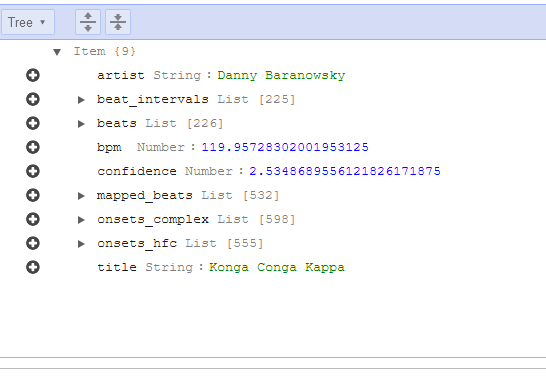

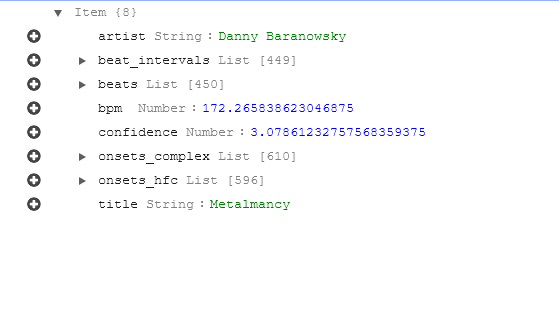

<h1>Conclusion</h1>
<p>Although my project does work, I feel like I could have done more. This was an especially challenging project, because I had to learn a bunch of new things at one. This was the first time I used Docker, so I had to take time to figure that out. I had to learn how to use the Essentia library, and there was other parts I wanted to implement like melody detection, but I did not have the time. Additionally, It really sucks when your VM becomes corrupted and you have to work on everything through a remote connection. There is still more I would like to do with this project, and some things that I feel would be worth fixing</p>

<p>One of the items on my fixing is is making the diagrams better. Currently, they work, but matplotlib tries to condense down into a nice picture, but it really doesen't work with several minute long songs. Here's an example of what they look like.</p>

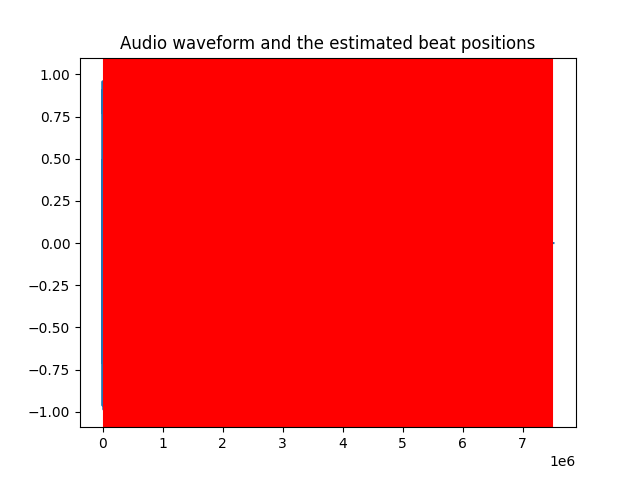

In [18]:
IPython.display.Image("https://joshcormiercadenza.s3.amazonaws.com/Portabellohead/diagrams/beats.png")

<p>As you can see there are lots of detected beats, so many, over the entire song, that it just forms a solid red rectangle. The graphs need to be stretched out, so that you can actually see the waveform which is underneath all the drawn in lines.</p>